In [45]:
# !sudo pip install Quandl

The directory '/home/mohan/.cache/pip/http' or its parent directory is not owned by the current user and the cache has been disabled. Please check the permissions and owner of that directory. If executing pip with sudo, you may want sudo's -H flag.
The directory '/home/mohan/.cache/pip' or its parent directory is not owned by the current user and caching wheels has been disabled. check the permissions and owner of that directory. If executing pip with sudo, you may want sudo's -H flag.
/usr/local/lib/python2.7/dist-packages/pip/_vendor/requests/packages/urllib3/util/ssl_.py:318: SNIMissingWarning: An HTTPS request has been made, but the SNI (Subject Name Indication) extension to TLS is not available on this platform. This may cause the server to present an incorrect TLS certificate, which can cause validation failures. You can upgrade to a newer version of Python to solve this. For more information, see https://urllib3.readthedocs.io/en/latest/security.html#snimissingwarning.
  SNIMiss

In [104]:
# !sudo pip install plotly

The directory '/home/mohan/.cache/pip/http' or its parent directory is not owned by the current user and the cache has been disabled. Please check the permissions and owner of that directory. If executing pip with sudo, you may want sudo's -H flag.
The directory '/home/mohan/.cache/pip' or its parent directory is not owned by the current user and caching wheels has been disabled. check the permissions and owner of that directory. If executing pip with sudo, you may want sudo's -H flag.
/usr/local/lib/python2.7/dist-packages/pip/_vendor/requests/packages/urllib3/util/ssl_.py:318: SNIMissingWarning: An HTTPS request has been made, but the SNI (Subject Name Indication) extension to TLS is not available on this platform. This may cause the server to present an incorrect TLS certificate, which can cause validation failures. You can upgrade to a newer version of Python to solve this. For more information, see https://urllib3.readthedocs.io/en/latest/security.html#snimissingwarning.
  SNIMiss

## Data Import from all the major Market Indicators around the World 
<p>NASDAQ Composite (^IXIC Yahoo Finance) - USA </p>
<p>Dow Jones Industrial Average (^DJI Yahoo Finance)  -USA </p>
<p>Frankfurt DAX (^GDAXI Yahoo Finance) - Germany </p>
<p>London FTSE-100 (^FTSE Yahoo Finance) - UK </p>
<p>Paris CAC 40 (^FCHI Yahoo Finance) - France</p>
<p>Tokyo Nikkei-225 (^N225 Yahoo Finance) - Japan</p>
<p>Hong Kong Hang Seng (^HSI Yahoo Finance) - China (H/K)</p>
<p>Australia ASX-200 (^AXJO Yahoo Finance) - Australia</p>

# Import all the libraries 

In [27]:
from pandas_datareader import data
import quandl
import seaborn as sns
import matplotlib.pyplot as plt
import time
import numpy as np
import math 
from talib.abstract import *
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import sklearn.preprocessing as preprocessing
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
import pandas as pd
import plotly 
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()

%matplotlib inline
plotly.tools.set_credentials_file(username='maiti.t', api_key='km8Kdfszic1Cu6ZAWiZJ')

print("Import Libraries and functions  Done ")

Import Libraries and functions  Done 


# Defining Function to Data Download 

In [28]:
def getStock(symbol, start, end):
    
    df =  data.get_data_yahoo(symbol, start, end)
    df.columns = df.columns + '_' + symbol
    df['Return_%s' %symbol] = df['Adj Close_%s' %symbol].pct_change()
    print(str(symbol)+ " Downloaded ")
    
    return df
print('User Defined functioned Defined ')

User Defined functioned Defined 


# Getting files from 2005 to current Date 

In [29]:
def datadownload(start):
    start = start
    end = time.strftime("%Y-%m-%d")
    print('Downloading Data from Yahoo Finance .....')
    nasdaq = getStock('^IXIC', start, end)
    dow = getStock('^DJI', start, end)
    sp500 = getStock('^GSPC',start,end)
    frankfurt = getStock('^GDAXI', start, end)
    london = getStock('^FTSE', start, end)
    paris = getStock('^FCHI', start, end)
    hkong = getStock('^HSI', start, end)
    nikkei = getStock('^N225', start, end)
    australia = getStock('^AXJO', start, end)
    india = getStock('^NSEI', start, end)
    print('Downloading Finished ')
    print("Sample Columns Present in World Market Indices "+ str(nasdaq.columns))
    return nasdaq,dow,sp500,frankfurt,london,paris,hkong,nikkei,australia,india
nasdaq,dow,sp500,frankfurt,london,paris,hkong,nikkei,australia,india=datadownload('2005-01-01')

^IXIC Downloaded 
^DJI Downloaded 
^GSPC Downloaded 
^GDAXI Downloaded 
^FTSE Downloaded 
^FCHI Downloaded 
^HSI Downloaded 
^N225 Downloaded 
^AXJO Downloaded 
^NSEI Downloaded 
Sample Columns Present in World Market Indices Index([u'Open_^IXIC', u'High_^IXIC', u'Low_^IXIC', u'Close_^IXIC',
       u'Adj Close_^IXIC', u'Volume_^IXIC', u'Return_^IXIC'],
      dtype='object')


## EDA 

## Relation between DOW and NASDAQ and S&P 500 

## Returns % Change form the previous Day iof the Trade in Dow 30 , Nasdaq and S& P 500 

In [31]:
import plotly.plotly as py
from plotly.graph_objs import *
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)
# init_notebook_mode(connected=True)

# plotly.offline.
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import cufflinks as cf
init_notebook_mode()
plotOne1 = pd.DataFrame()
plotOne1['Return_^DJI']=dow['Return_^DJI']
plotOne1['Return_^IXIC']=nasdaq['Return_^IXIC']
plotOne1['Return_^GSPC'] =sp500['Return_^GSPC']

# plotOne.iplot(xTitle='Date',title='Returns % Change form the previous Day',yTitle='Return Change (%)',vline=['2007-12-01'],annotations= [{'x': '2007-12-01', 'y': 1, 
#                                                  'xref': 'x','yref': 'paper',
#                                                  'showarrow': True ,'xanchor': 'left',
#                                                   'text': 'Official start of the recession'}])

plotly.offline.iplot({
    "data": [go.Scatter(x=dow.index, y=dow['Return_^DJI'],name='DJI'),
             go.Scatter(x=dow.index, y=nasdaq['Return_^IXIC'],name='NASDAQ'),
             go.Scatter(x=dow.index, y=sp500['Return_^GSPC'],name='S&P500')],
    "layout": Layout(title="Stock  Returns ",
                           xaxis=dict(title='Data'),
                           shapes= [{'x0': '2007-12-01', 'x1': '2007-12-01',
                                      'y0': 0, 'y1': 1, 'xref': 'x', 'yref': 'paper',
                                      'line': {'color': 'rgb(30,30,30)', 'width': 1}}],
                           annotations= [{'x': '2007-12-01', 'y': 1, 
                                          'xref': 'x','yref': 'paper',
                                          'showarrow': True, 'xanchor': 'left',
                                          'text': 'Official start of the recession'}])
})




## Closing Price of DOw 30 , NASDAq , S& P 500 

In [32]:
# plotly.offline.iplot({
#     "data": [Bar(x=dow.index, y=dow['Return_^DJI'].head(100),name='DJI'),
#              Bar(x=dow.index, y=nasdaq['Return_^IXIC'].head(100),name='NASDAQ'),
#              Bar(x=dow.index, y=sp500['Return_^GSPC'].head(100),name='S&P500')],
#     "layout": Layout(title="Stock  Returns ")
# })

plotTwo1 = pd.DataFrame()
plotTwo1['Close_^DJI']=dow['Close_^DJI']
plotTwo1['Close_^IXIC']=nasdaq['Close_^IXIC']
plotTwo1['Close_^GSPC'] = sp500['Close_^GSPC']

plotTwo1.iplot(xTitle='Date',yTitle='Closing Price (%)',title='World Marlet Closing Prices $',vline=['2007-12-01'],
              annotations= [{'x': '2007-12-01', 'y': 1, 
                                                 'xref': 'x','yref': 'paper',
                                                 'showarrow': True ,'xanchor': 'left',
                                                  'text': 'Official start of the recession'}])

In [33]:
plotTwo2 = pd.DataFrame()
plotTwo2['Close_^USD']=dow['Close_^DJI']
plotTwo2['Close_^Germany']=frankfurt['Close_^GDAXI']
plotTwo2['Close_^london'] = london['Close_^FTSE']
plotTwo['Close_^Paris'] = paris['Close_^FCHI']
plotTwo2['Close_^China'] = hkong['Close_^HSI']
plotTwo2['Close_^Japan'] = nikkei['Close_^N225']
plotTwo2['Close_^Australia'] = australia['Close_^AXJO']
plotTwo2['Close_^India'] = india['Close_^NSEI']

plotTwo2.iplot(xTitle='Date',yTitle='Closing Price (%)',title='World Market Indicator Closing Prices $',vline=['2007-12-01'],
              annotations= [{'x': '2007-12-01', 'y': 1, 
                                                 'xref': 'x','yref': 'paper',
                                                 'showarrow': True ,'xanchor': 'left',
                                                  'text': 'Official start of the recession'}])

In [34]:
dow.describe()

,Open_^DJI,High_^DJI,Low_^DJI,Close_^DJI,Adj Close_^DJI,Volume_^DJI,Return_^DJI
count,3180.000000,3180.000000,3180.000000,3180.000000,3180.000000,3.180000e+03,3179.000000
mean,13563.457961,13638.865414,13486.001236,13567.060531,13567.060531,1.954627e+08,0.000283
std,3342.618938,3337.735805,3347.546631,3343.903398,3343.903398,9.908153e+07,0.011113
min,6547.009766,6709.609863,6469.950195,6547.049805,6547.049805,8.410000e+06,-0.078733
25%,10955.509765,11035.402832,10875.562256,10959.129639,10959.129639,1.128900e+08,-0.003935
50%,12692.475098,12764.110351,12617.510254,12695.634765,12695.634765,1.826600e+08,0.000484
75%,16450.939453,16521.184570,16369.904786,16448.850098,16448.850098,2.551225e+08,0.005120
max,22100.199219,22179.109375,22081.970703,22118.419922,22118.419922,7.384400e+08,0.110803


In [35]:
plotTwo3 = pd.DataFrame()
plotTwo3['Close_^USD']=dow['Close_^DJI']/max(dow['Close_^DJI'])
plotTwo3['Close_^Germany']=frankfurt['Close_^GDAXI']/max(frankfurt['Close_^GDAXI'])
plotTwo3['Close_^london'] = london['Close_^FTSE']/max(london['Close_^FTSE'])
plotTwo3['Close_^Paris'] = paris['Close_^FCHI']/max(paris['Close_^FCHI'])
plotTwo3['Close_^China'] = hkong['Close_^HSI']/max(hkong['Close_^HSI'])
plotTwo3['Close_^Japan'] = nikkei['Close_^N225']/max(nikkei['Close_^N225'])
plotTwo3['Close_^Australia'] = australia['Close_^AXJO']/max(australia['Close_^AXJO'])
plotTwo3['Close_^India'] = india['Close_^NSEI']/max(india['Close_^NSEI'])
plotTwo3.iplot(xTitle='Date',yTitle='Normalised Closing Price (%)',title='World Market Normalised Data -Closing Prices $',vline=['2007-12-01'],
              annotations= [{'x': '2007-12-01', 'y': 1, 
                                                 'xref': 'x','yref': 'paper',
                                                 'showarrow': True ,'xanchor': 'left',
                                                  'text': 'Official start of the recession'}])

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:8: FutureWarning:

'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:9: FutureWarning:

'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:10: FutureWarning:

'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:11: FutureWarning:

'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:12: FutureWarning:

'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.

/usr/local/lib/py

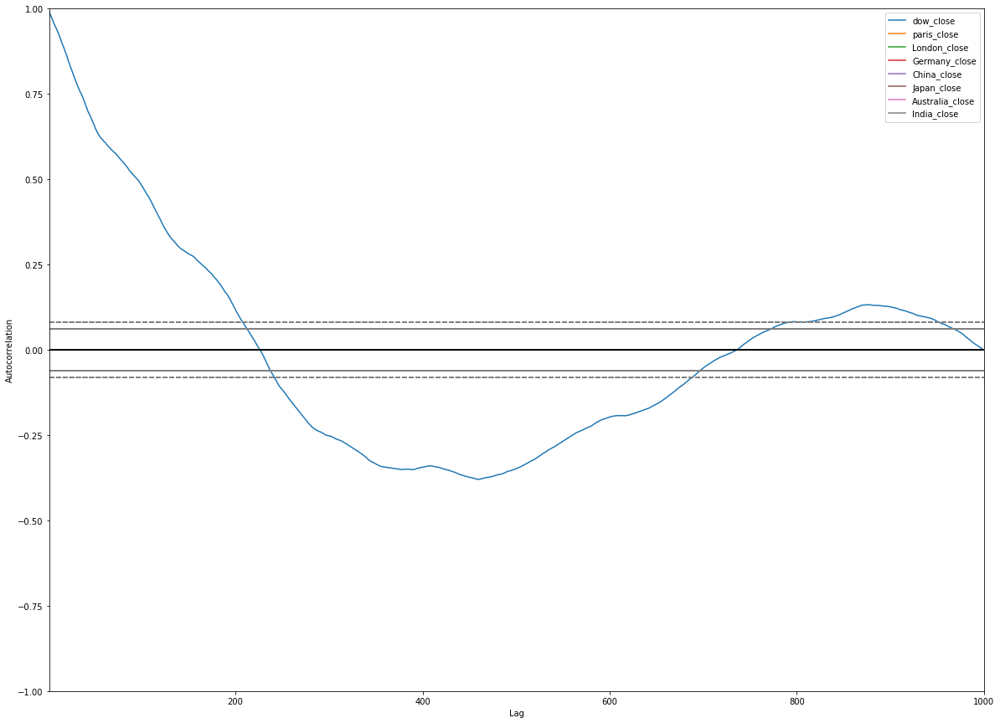

In [12]:
from pandas.tools.plotting import autocorrelation_plot
import matplotlib.pyplot as plt
%matplotlib inline
fig = plt.figure()
fig.set_figwidth(20)
fig.set_figheight(15)

_ = autocorrelation_plot(dow['Close_^DJI'].head(1000), label='dow_close')
_ = autocorrelation_plot(paris['Close_^FCHI'].head(1000), label='paris_close')
_ = autocorrelation_plot(london['Close_^FTSE'].head(1000), label='London_close')
_ = autocorrelation_plot(frankfurt['Close_^GDAXI'].head(1000), label='Germany_close')
_ = autocorrelation_plot(hkong['Close_^HSI'].head(1000), label='China_close')
_ = autocorrelation_plot(nikkei['Close_^N225'].head(1000), label='Japan_close')
_ = autocorrelation_plot(australia['Close_^AXJO'].head(1000), label='Australia_close')
_ = autocorrelation_plot(india['Close_^NSEI'].head(1000), label='India_close')

_ = plt.legend(loc='upper right')

In [37]:
from plotly.graph_objs import *
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)

## Daily High and Low of DOW 30

In [143]:
 

# dow.iplot()
pyplot.offline.iplot({
    "data": [go.Scatter(x=dow.index, y=dow['High_^DJI'],name='Open',
                opacity = 0.8),
             go.Scatter(x=dow.index, y=dow['Low_^DJI'],name='Close',
                opacity = 0.8)],
    "layout": Layout(title="High and Low - DOW 30 ",
                     xaxis=dict(rangeselector=dict(
                                                    buttons=list([
                                                        dict(count=1,label='1m',step='month',stepmode='backward'),
                                                        dict(count=6,label='6m',step='month',stepmode='backward'),
                                                        dict(step='all')])
                                                  ),
                                rangeslider=dict(),
                                type='date',
                                title='Date'
                               ),
                    yaxis=dict(title='Unit in USD $ '))
})

In [ ]:
# World Market Indice Comparision - Time Series 

In [145]:
plotly.offline.iplot({
    "data": [Scatter(x=dow.index, y=dow['Return_^DJI'].head(100),name='USA'),
             Scatter(x=dow.index, y=frankfurt['Return_^GDAXI'].head(100),name='Germany'),
             Scatter(x=dow.index, y=nikkei['Return_^N225'].head(100),name='Japan'),
             Scatter(x=dow.index, y=london['Return_^FTSE'].head(100),name='London'),
             Scatter(x=dow.index, y=paris['Return_^FCHI'].head(100),name='France'),
             Scatter(x=dow.index, y=australia['Return_^AXJO'].head(100),name='Australia'),
             Scatter(x=dow.index, y=india['Return_^NSEI'].head(100),name='India')],
    "layout": Layout(title="World Market Indice Comparision - Time Series ", 
                     yaxis=dict(title='Return Change in % (Daily) '), xaxis=dict(title='Date'),)
})

In [25]:
# logData= pd.DataFrame()
# logData['Dow_log_return'] = np.log(dow['Close_^DJI']/dow['Close_^DJI'].shift())
# logData['Paris_log_return'] = np.log(paris['Close_^FCHI']/paris['Close_^FCHI'].shift())
# logData['London_log_return'] = np.log(london['Close_^FTSE']/london['Close_^FTSE'].shift())
# logData['Germany_log_return'] = np.log(frankfurt['Close_^GDAXI']/frankfurt['Close_^GDAXI'].shift())
# logData['China_log_return'] = np.log(hkong['Close_^HSI']/hkong['Close_^HSI'].shift())
# logData['Japan_log_return'] = np.log(nikkei['Close_^N225']/nikkei['Close_^N225'].shift())
# logData['Australia_log_return'] = np.log(australia['Close_^AXJO']/australia['Close_^AXJO'].shift())
# logData['India_log_return'] = np.log(india['Close_^NSEI']/india['Close_^NSEI'].shift())
# logData.describe()

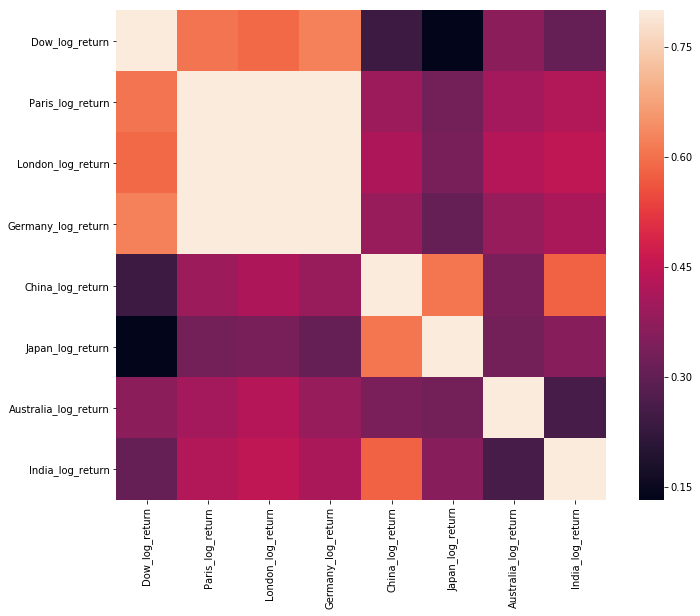

In [24]:
# co= logData.corr()
# f, ax = plt.subplots(figsize=(12, 9))
# sns.heatmap(co, vmax=.8, square=True);
# plt.show()

## Merging all the data collected into single dataframe 

In [10]:
print("Merging All the World Market Indicators ")
result = dow.join(frankfurt['Close_^GDAXI']).join(london['Close_^FTSE']).join(paris['Close_^FCHI']).join(hkong['Close_^HSI']).join(nikkei['Close_^N225']).join(australia['Close_^AXJO']).join(india['Close_^NSEI'])
print("Total number of Rows present in the dataset to analyse (Worls Market Indicators ) "+ str(len(result)))

Merging All the World Market Indicators 
Total number of Rows present in the dataset to analyse (Worls Market Indicators ) 3179


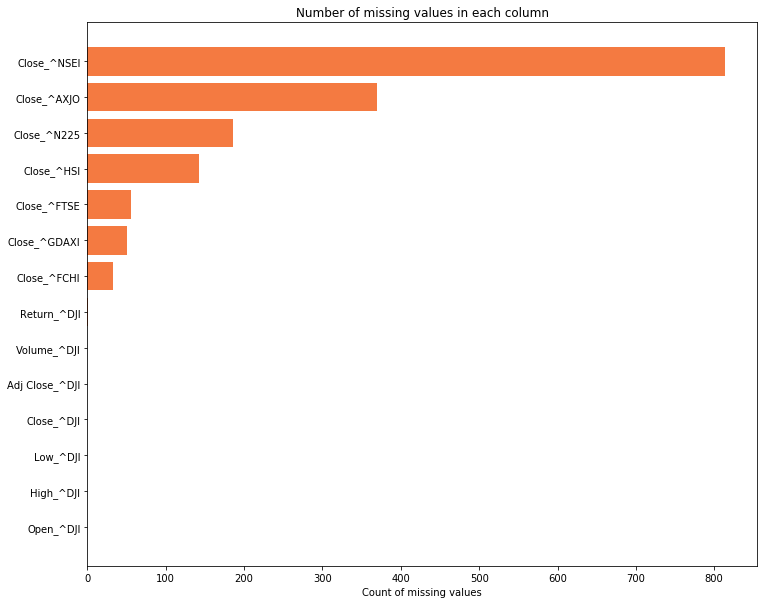

In [108]:
missing_df = result.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
# missing_df = missing_df.ix[missing_df['missing_count']>0]
missing_df = missing_df.sort_values(by='missing_count')

ind = np.arange(missing_df.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(12,10))
rects = ax.barh(ind, missing_df.missing_count.values, color='#f47a41')
ax.set_yticks(ind)
ax.set_yticklabels(missing_df.column_name.values, rotation='horizontal')
ax.set_xlabel("Count of missing values")
ax.set_title("Number of missing values in each column")
plt.show()

# Data Preprocessing

In [109]:
result =result.bfill()

In [110]:
result.columns

Index([u'Open_^DJI', u'High_^DJI', u'Low_^DJI', u'Close_^DJI',
       u'Adj Close_^DJI', u'Volume_^DJI', u'Return_^DJI', u'Close_^GDAXI',
       u'Close_^FTSE', u'Close_^FCHI', u'Close_^HSI', u'Close_^N225',
       u'Close_^AXJO', u'Close_^NSEI'],
      dtype='object')

# Univariate Analysis World Market Indicators 

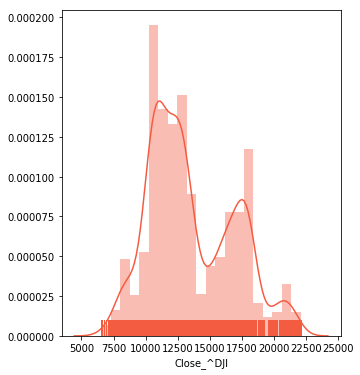

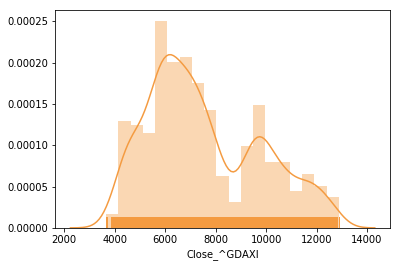

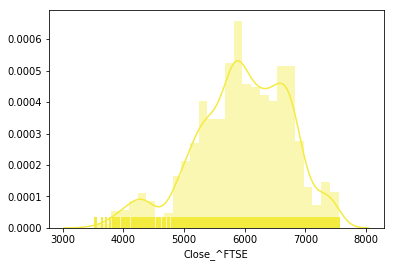

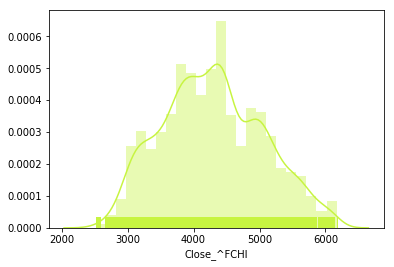

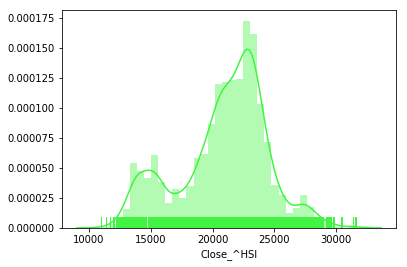

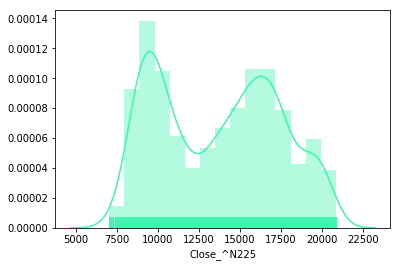

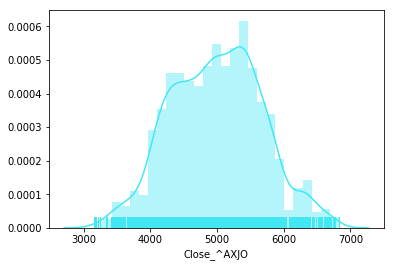

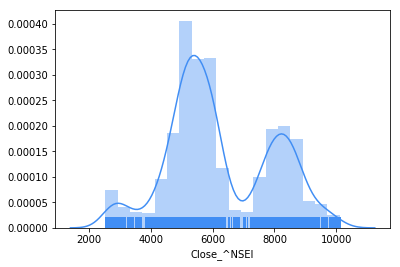

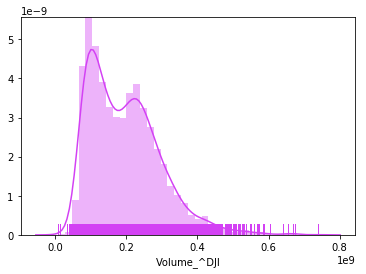

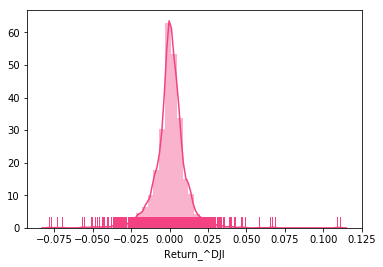

In [34]:
plt.figure(figsize=(5, 6))
sns.distplot(result['Close_^DJI'].dropna(),rug=True,color="#f45c42",);plt.show();
sns.distplot(result['Close_^GDAXI'].dropna(),rug=True,color="#f49b41");plt.show();
sns.distplot(result['Close_^FTSE'].dropna(),rug=True,color="#f4eb41");plt.show();
sns.distplot(result['Close_^FCHI'].dropna(),rug=True,color="#c7f441");plt.show();
sns.distplot(result['Close_^HSI'].dropna(),rug=True,color="#41f443");plt.show();
sns.distplot(result['Close_^N225'].dropna(),rug=True,color="#41f4af");plt.show();
sns.distplot(result['Close_^AXJO'].dropna(),rug=True,color="#41e8f4");plt.show();
sns.distplot(result['Close_^NSEI'].dropna(),rug=True,color="#418ef4");plt.show();
sns.distplot(result['Volume_^DJI'].dropna(),rug=True,color="#d341f4");plt.show();
sns.distplot(result['Return_^DJI'].dropna(),rug=True,color="#f44182");plt.show();



## Bivariate analaysis 

In [111]:
result = result.astype(float)

## Normalization of Data 

In [128]:
min_max_scaler = preprocessing.MinMaxScaler()
X1_train_minmax = min_max_scaler.fit_transform(result['Close_^DJI'].values.reshape(-1,1))
X2_train_minmax = min_max_scaler.fit_transform(result['Close_^FCHI'].values.reshape(-1,1))
X3_train_minmax = min_max_scaler.fit_transform(result['Close_^GDAXI'].values.reshape(-1,1))
X4_train_minmax = min_max_scaler.fit_transform(result['Close_^FTSE'].values.reshape(-1,1))
X5_train_minmax = min_max_scaler.fit_transform(result['Close_^HSI'].values.reshape(-1,1))
X6_train_minmax = min_max_scaler.fit_transform(result['Close_^N225'].values.reshape(-1,1))
X7_train_minmax = min_max_scaler.fit_transform(result['Close_^AXJO'].values.reshape(-1,1))




In [132]:
bv1={'Close_^DJI':result['Close_^DJI']}
bv1=pd.DataFrame(bv1)
del bv1['Close_^DJI']
 
bv1['Close_^DJI']=X1_train_minmax
bv1['Close_^FCHI']=X2_train_minmax
bv1['Close_^GDAXI']=X3_train_minmax
bv1['Close_^FTSE']=X4_train_minmax
bv1['Close_^HSI']=X5_train_minmax
bv1['Close_^N225']=X6_train_minmax
bv1['Close_^AXJO']=X7_train_minmax

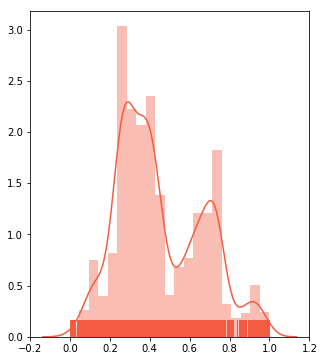

In [105]:
# plt.figure(figsize=(5, 6))
# sns.distplot(X_train_minmax,rug=True,color="#f45c42",);plt.show();

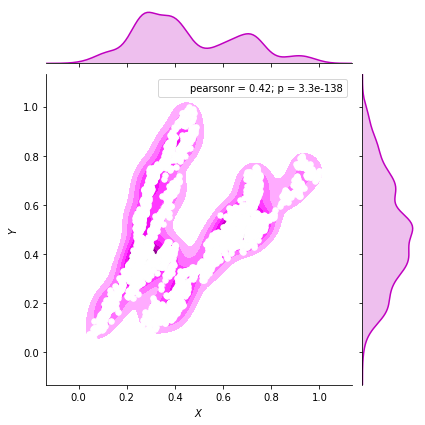

In [127]:
g = sns.jointplot(x="Close_^DJI", y="Close_^FCHI", data=result, kind="kde", color="m")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker=".")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$X$", "$Y$");

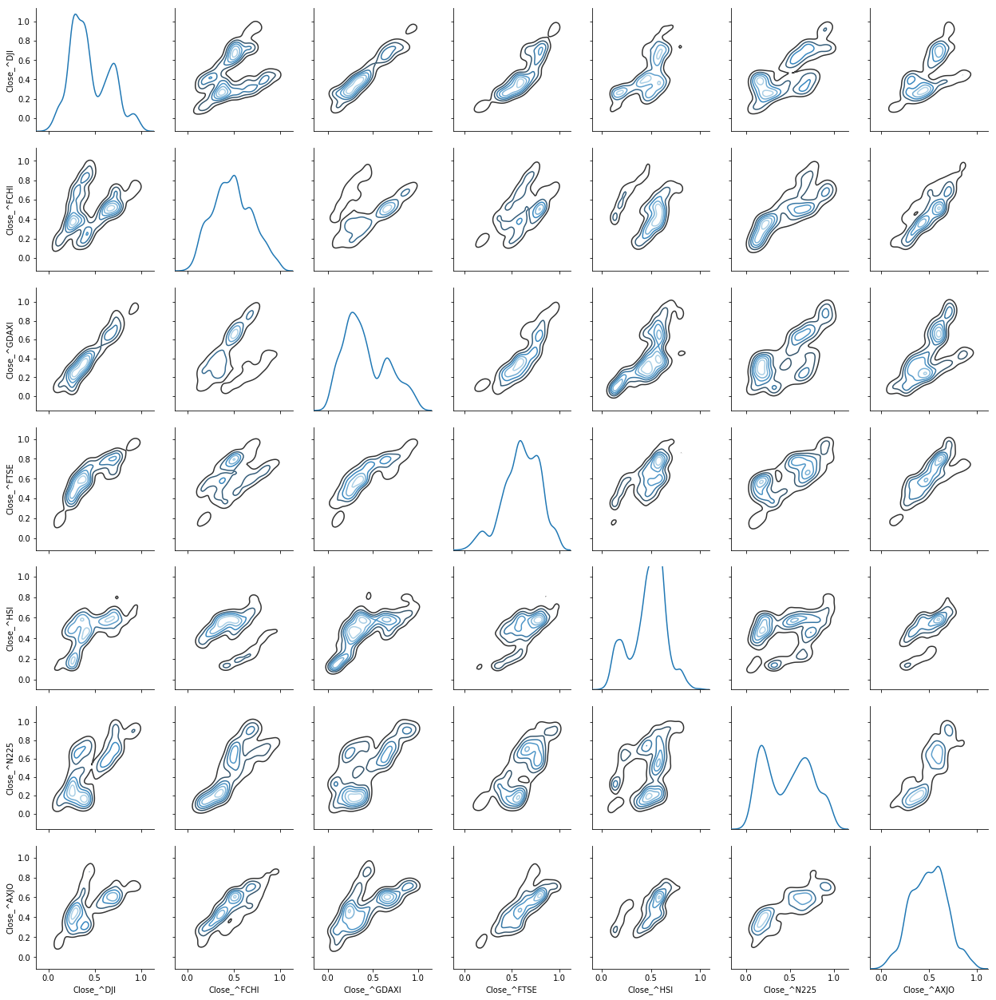

In [134]:
g = sns.PairGrid(bv1)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot, cmap="Blues_d", n_levels=6);

## Finding Co relativity 

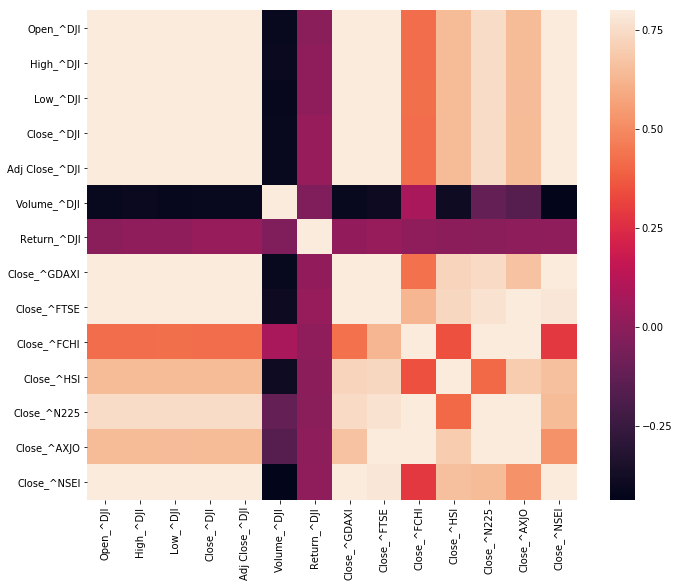

In [135]:
co= result.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(co, vmax=.8, square=True);
plt.show()

# USA - France Market Comparison 

In [26]:
plotly.offline.iplot({
    "data": [go.Candlestick(x=dow.index, open=dow['Open_^DJI'],
                       high=dow['High_^DJI'],
                       low=dow['Low_^DJI'],
                       close=dow['Close_^DJI'],name='USA'),
#              go.Candlestick(x=dow.index, y=frankfurt['Return_^GDAXI'].head(100),name='Germany'),
#              go.Candlestick(x=dow.index, y=nikkei['Return_^N225'].head(100),name='Japan'),
#              go.Candlestick(x=dow.index, y=london['Return_^FTSE'].head(100),name='London'),
             go.Candlestick(x=dow.index, open=paris['Open_^FCHI'],high=paris['High_^FCHI'],low = paris['Low_^FCHI'],
                                         close=paris['Close_^FCHI'],name='France')],
#              go.Candlestick(x=dow.index, y=australia['Return_^AXJO'].head(100),name='Australia'),
#              go.Candlestick(x=dow.index, y=india['Return_^NSEI'].head(100),name='India')],
    "layout": Layout(title="USA - France Market Comparison ", yaxis=dict(title='Unit in USD $ '), xaxis=dict(title='Date'),
                    shapes= [{'x0': '2007-12-01', 'x1': '2007-12-01',
                                'y0': 0, 'y1': 1, 'xref': 'x', 'yref': 'paper',
                                'line': {'color': 'rgb(30,30,30)', 'width': 1}}],
                                annotations= [{'x': '2007-12-01', 'y': 1, 
                                                 'xref': 'x','yref': 'paper',
                                                 'showarrow': True, 'xanchor': 'left',
                                                  'text': 'Official start of the recession'}])
})

## As the Graphics Say USD is mostly co related with the France ,China, Australia 

In [146]:
plotly.offline.iplot({
    "data": [Bar(x=dow.index, y=dow['Return_^DJI'].head(30),name='USA'),
             Bar(x=dow.index, y=paris['Return_^FCHI'].head(30),name='France'),
             Bar(x=dow.index, y=australia['Return_^AXJO'].head(30),name='Australia'),
             Bar(x=dow.index, y=hkong['Return_^HSI'].head(30),name='China')],
    "layout": Layout(title="Stock  Returns Comparision USA ,FRance, Australia, China",yaxis=dict(title='Return Change in % (Daily) '),
                     xaxis=dict(title='Date'))
})

# Adding features to our dataset 

In [3]:
# stocks = {}
# for i in top_3:
#     stocks[i] = dr.data.DataReader(i, 'yahoo',start,end)
def get_indicators(stocks, period):
    stocks_indicators = {}
    for i in stocks:
        print("Adding Features in :  "+ str(i))
        features = pd.DataFrame(SMA(stocks[i], timeperiod=5))
        features.columns = ['sma_5']
        features['sma_10'] = pd.DataFrame(SMA(stocks[i], timeperiod=10))
        features['mom_10'] = pd.DataFrame(MOM(stocks[i],10))
        features['wma_10'] = pd.DataFrame(WMA(stocks[i],10))
        features['wma_5'] = pd.DataFrame(WMA(stocks[i],5))
        features['T3'] =pd.DataFrame(T3(stocks[i], timeperiod=5, vfactor=0))
        features['CORREL']=pd.DataFrame(CORREL(stocks[i], timeperiod=30))
        features['NATR']=pd.DataFrame(NATR(stocks[i], timeperiod=14))
        features['adosc'] = pd.DataFrame(ADOSC(stocks[i], fastperiod=3, slowperiod=10))
        features = pd.concat([features,STOCHF(stocks[i], fastk_period=14, fastd_period=3)], axis=1)
        features['macd'] = pd.DataFrame(MACD(stocks[i], fastperiod=12, slowperiod=26)['macd'])
        features['rsi'] = pd.DataFrame(RSI(stocks[i], timeperiod=14))
        features['willr'] = pd.DataFrame(WILLR(stocks[i], timeperiod=14))
        features['closePrice']=pd.DataFrame(stocks[i]['close'].shift(-period))
        features['return_pct_change'] = ROC(stocks[i], timeperiod=period)
        features['return_pct_change'] = features['return_pct_change'].shift(-period)
        features['pct_change'] = features['return_pct_change'].apply(lambda x: '1' if x > 0 else '0' if x <= 0 else np.nan)
        features = features.dropna()
#         features = features.iloc[np.where(features.index=='1998-5-5')[0][0]:np.where(features.index=='2015-5-5')[0][0]]
        stocks_indicators[i] = features
    return stocks_indicators

In [4]:
def getStock1(symbol, start, end):
    
    df =  data.get_data_yahoo(symbol, start, end)
    df.columns = [s.lower() for s in df.columns]
    df['Return_%s' %symbol] = df['close'].pct_change()
    df.volume = df.volume.apply(lambda x: float(x))
    print(str(symbol)+ " Downloaded ")
    
    return df

In [5]:
start='2005-01-01'
end = time.strftime("%Y-%m-%d")
dow30 = getStock1('^DJI', start, end)
france=getStock1('^FCHI',start,end)
china=getStock1('^HSI',start,end)
aus=getStock1('^AXJO',start,end)



^DJI Downloaded 
^FCHI Downloaded 
^HSI Downloaded 
^AXJO Downloaded 


In [6]:
stock={'DOW30':dow30}
si = get_indicators(stock,1)

fc = france['close']
ch=china['close']
au=aus['close']
dow30temp = si['DOW30']
fct = fc[dow30temp.index]
cht=ch[dow30temp.index]
aut=au[dow30temp.index]
si['DOW30']['closePriceFrance']=fct
si['DOW30']['closePriceChina']=cht
si['DOW30']['closePriceAus']=aut


Adding Features in :  DOW30


In [7]:
si['DOW30'].tail()

,sma_5,sma_10,mom_10,wma_10,wma_5,T3,CORREL,NATR,adosc,fastk,fastd,macd,rsi,willr,closePrice,return_pct_change,pct_change,closePriceFrance,closePriceChina,closePriceAus
Date,,,,,,,,,,,,,,,,,,,,
2017-08-04,21998.037891,21845.466016,512.740234,21938.143501,22029.075391,21805.908028,0.981561,0.471761,3.272645e+08,100.000000,97.738868,170.702350,76.960211,-0.000000,22118.419922,0.115917,1,5203.439941,27562.679688,5720.600098
2017-08-07,22043.498047,21905.991016,605.250000,21987.771484,22069.202734,21851.361412,0.984349,0.450209,3.797644e+08,99.563139,98.764977,179.233454,77.693095,-0.436861,22085.339844,-0.149559,0,5207.890137,27690.359375,5773.600098
2017-08-08,22067.782031,21953.182031,471.910156,22020.380362,22083.150000,21893.820244,0.984548,0.458077,3.217452e+08,86.270501,95.277880,181.235954,74.400887,-13.729499,22048.699219,-0.165905,0,5218.890137,27854.910156,5743.799805
2017-08-09,22074.273828,21986.950977,337.689453,22037.747124,22076.789063,21930.120214,0.985118,0.454783,3.323428e+08,80.905672,88.913104,177.816599,70.821167,-19.094328,21844.009766,-0.928352,0,5145.700195,27757.089844,5765.700195
2017-08-10,22037.855860,21991.696875,47.458985,22011.757813,22000.034375,21951.994957,0.983872,0.493211,2.100516e+08,50.935556,72.703910,156.782713,54.923132,-49.064444,21858.320313,0.065512,1,5115.229980,27444.000000,5760.899902


# Feature Engineering 

# Recursive feature elimination  

In [8]:
def rfe(x_train,y_train):
    print('_________________________________________________________')
    print('Starting Recursive Feature Elimination ....................')
    print('_________________________________________________________')
    b=time.time()
#     svc = SVC(kernel="linear",C=1)
#     rfe = RFE(estimator=svc, n_features_to_select=10, step=2)
#     rfe.fit(X, y)
    lr = LogisticRegression()
    y_train2=np.ravel(y_train)   
    rfe = RFE(estimator=lr, n_features_to_select=5, step=2)
#     y_train2=np.ravel(y_train) 
    print(type(y_train2))
#     rfe = RFE(estimator=lr, n_features_to_select=5, step=2)
    rfe.fit(x_train,y_train2)
    ranking = rfe.ranking_
    e=time.time()
    print("Time in Processing : "+str(e-b)+"sec")
    rfe.ranking_
    ranks = zip(map(lambda x: round(x, 4), rfe.ranking_), x_train.columns)
    ranks = sorted(ranks)
    print("Result :::")
    for v in ranks:
        print(v)
    return ranks

In [9]:
si['DOW30'].dropna(inplace=True)

In [10]:
y_train = si['DOW30']['closePrice']
x_train = si['DOW30']
del x_train['closePrice']


In [13]:
x_train = x_train.astype(int)
y_train = y_train.astype(int)

In [160]:

ranks = rfe(x_train,y_train)

_________________________________________________________
Starting Recursive Feature Elimination ....................
_________________________________________________________
<type 'numpy.ndarray'>
Time in Processing : 601.101629019sec
Result :::
(1.0, 'NATR')
(1.0, 'fastk')
(1.0, 'pct_change')
(1.0, 'return_pct_change')
(1.0, 'willr')
(2.0, 'fastd')
(2.0, 'rsi')
(3.0, 'sma_10')
(3.0, 'wma_10')
(4.0, 'T3')
(4.0, 'sma_5')
(5.0, 'macd')
(5.0, 'wma_5')
(6.0, 'closePriceAus')
(6.0, 'closePriceFrance')
(7.0, 'closePriceChina')
(7.0, 'mom_10')
(8.0, 'CORREL')
(8.0, 'adosc')


In [11]:
def rfecv(x,y):
    print('_________________________________________________________')
    print('Starting Recursive feature elimination with cross-validation')
    print('_________________________________________________________')
    print('It may take a take time to do the analysis ')
    b =time.time()
 
    
    svc = SVC(kernel="linear")
 
    rfecv = RFECV(estimator=svc, step=1, cv=StratifiedKFold(2),scoring='accuracy')
 
    rfecv.fit(x,y)

    e=time.time()
    print('Total Time Taken : '+str(e-b)+ "sec")
    print("Optimal number of features : %d" % rfecv.n_features_)
 
    plt.figure()
    plt.xlabel("Number of features selected")
    plt.ylabel("Cross validation score (nb of correct classifications)")
    plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
    plt.show()
    
    rfecv.ranking_
    
    ranking_out = zip(map(lambda x: round(x, 8), rfecv.ranking_), x_train.columns)
    
    print(sorted(ranking_out))

In [ ]:
print("Currently Commented out : RFECV Method  as it takes time > 12 hours ")
# rfecv(x_train,y_train)

_________________________________________________________
Starting Recursive feature elimination with cross-validation
_________________________________________________________
It may take a take time to do the analysis 


## Linear Regression on DOW 30 Index 

In [86]:
dow['Day'] = dow.index.day
tempDow = dow[dow.index.year == 2017]

tempDow = tempDow[tempDow.index.month == 7 ]
closePrice = tempDow[tempDow.columns[3]]
tradeDay = tempDow[tempDow.columns[7]]

In [42]:
tempDow.head()

,Open_^DJI,High_^DJI,Low_^DJI,Close_^DJI,Adj Close_^DJI,Volume_^DJI,Return_^DJI,Day
Date,,,,,,,,
2017-07-03,21392.300781,21562.750000,21391.710938,21479.269531,21479.269531,186810000,0.006072,3
2017-07-05,21492.830078,21505.359375,21404.759766,21478.169922,21478.169922,273690000,-0.000051,5
2017-07-06,21423.929688,21433.099609,21305.380859,21320.039063,21320.039063,320450000,-0.007362,6
2017-07-07,21354.660156,21425.820313,21350.720703,21414.339844,21414.339844,242240000,0.004423,7
2017-07-10,21381.230469,21446.390625,21371.109375,21408.519531,21408.519531,270340000,-0.000272,10


In [33]:
def predict_price(dates,prices,x):
    linear_mod = linear_model.LinearRegression() #defining the linear regression model
    dates = np.reshape(dates,(len(dates),1)) # converting to matrix of n X 1
    prices = np.reshape(prices,(len(prices),1))
    linear_mod.fit(dates,prices) #fitting the data points in the model
    predicted_price =linear_mod.predict(x)
    return predicted_price[0][0],linear_mod.coef_[0][0] ,linear_mod.intercept_[0]

## Training with first 75 % days of a month 

In [53]:
numb = int(len(tradeDay)*.75)

In [61]:
dates = np.reshape(tradeDay.head(numb),(numb,1))
prices = np.reshape(closePrice.head(numb),(numb,1))

linear_mod = linear_model.LinearRegression()
linear_mod.fit(dates,prices)

## Prediciting all the dates of the month 
predictDates = np.reshape(tradeDay.tail(len(tradeDay)),(len(tradeDay),1))
d=linear_mod.predict(predictDates)
r= np.reshape(d,(1,len(d)))

In [62]:
plotly.offline.iplot({
    "data": [go.Scatter(x=tradeDay, y=closePrice,name='DJI'),
             go.Scatter(x=tradeDay, y=r[0],name='Logistic Regression')],
    "layout": Layout(title="Logistic Regression Stock Opeing Price Dow 30 Index  $",
                     yaxis=dict(title='Return Change in % (Daily) '),
                     xaxis=dict(title='Day in July Month 2017'))
})

In [83]:
predicted_price, coefficient, constant = predict_price(dates,prices,29)  
lrScore = linear_mod.score(dates,prices)
pred=linear_mod.predict(dates)
mae=mean_absolute_error(prices,pred)
mape=np.mean(np.abs((prices - pred) / prices))*100
rmse=math.sqrt(mean_squared_error(prices,pred))


In [84]:

print "The stock open price for 29th July is: $",str(predicted_price)
print "The regression coefficient is ",str(coefficient),", and the constant is ", str(constant)
print "the relationship equation between dates and prices is: price = ",str(coefficient),"* date + ",str(constant)
print("Score of the Linear Regression Model :" + str(lrScore) )
print(" Mean Absolute Error of the Logistic Regression Model : "+ str(mae))
print("Mean Absolute Percentage Error of Logistic Regression Model : "+ str(mape))
print("Root Mean Square - Logistic Regression Model : "+ str(rmse))


The stock open price for 29th July is: $ 21680.8329944
The regression coefficient is  10.3399800186 , and the constant is  21380.9735738
the relationship equation between dates and prices is: price =  10.3399800186 * date +  21380.9735738
Score of the Linear Regression Model :0.450493904673
 Mean Absolute Error of the Logistic Regression Model : 60.9987837842
Mean Absolute Percentage Error of Logistic Regression Model : 0.283718021127
Root Mean Square - Logistic Regression Model : 70.6023998683


#  Logistic Regression on all months in 2017

In [111]:
dow['Day'] = dow.index.day
tempyearDow = dow[dow.index.year == 2017]
allscore =[]
allmape=[]
linear_mod = linear_model.LinearRegression()
for i in range(1,8):
#     print(i)
    tempDow = tempyearDow[tempyearDow.index.month == i ]
    closePrice = tempDow[tempDow.columns[3]]
    tradeDay = tempDow[tempDow.columns[7]]
    
    numb = int(len(tradeDay)*.75)
    print("Total Number of Entries Present in the Data Frame : "+ str(len(tradeDay)))
    print("Number of training Sample taken "+ str(numb))

    dates = np.reshape(tradeDay.head(numb),(numb,1))
    prices = np.reshape(closePrice.head(numb),(numb,1))

    linear_mod.fit(dates,prices)

## Prediciting all the dates of the month 
    predictDates = np.reshape(tradeDay.tail(len(tradeDay)),(len(tradeDay),1))
    d=linear_mod.predict(predictDates)
    r= np.reshape(d,(1,len(d)))
    ## Plotting in Plotly 
    plotly.offline.iplot({
    "data": [go.Scatter(x=tradeDay, y=closePrice,name='DJI'),
             go.Scatter(x=tradeDay, y=r[0],name='Logistic Regression')],
    "layout": Layout(title="Logistic Regression Stock Opeing Price Dow 30 Index  $",
                     yaxis=dict(title='Return Change in % (Daily) '),
                     xaxis=dict(title='Day in Month '+str(i)+' 2017'))
    })
    ## Prediciting for a given input date 
    predicted_price, coefficient, constant = predict_price(dates,prices,29) 
    ## Aggregating all the Scores from Month Jan - July 2017 
    lrScore = linear_mod.score(dates,prices)
    allscore.append(lrScore)
    pred=linear_mod.predict(dates)
    mae=mean_absolute_error(prices,pred)
    mape=np.mean(np.abs((prices - pred) / prices))*100
    allmape.append(mape)
    rmse=math.sqrt(mean_squared_error(prices,pred))

Total Number of Entries Present in the Data Frame : 20
Number of training Sample taken 15


Total Number of Entries Present in the Data Frame : 19
Number of training Sample taken 14


Total Number of Entries Present in the Data Frame : 23
Number of training Sample taken 17


Total Number of Entries Present in the Data Frame : 19
Number of training Sample taken 14


Total Number of Entries Present in the Data Frame : 22
Number of training Sample taken 16


Total Number of Entries Present in the Data Frame : 22
Number of training Sample taken 16


Total Number of Entries Present in the Data Frame : 20
Number of training Sample taken 15


## Returns the coefficient of determination R^2 of the prediction - Score 
## Scores of the Logistic Regression Models from Jan - July - 2017 

In [107]:
allscore

[0.36397275981048083,
 0.94825165770336262,
 0.6349980035933338,
 0.45892145997282363,
 0.27553094225190866,
 0.81684284252082529,
 0.45049390467304817]

In [112]:
allmape

[0.18897399442885959,
 0.2572192406603111,
 0.2944995318117819,
 0.22171499119912216,
 0.34929173030988497,
 0.19880443625440633,
 0.28371802112653838]